# Домашняя работа №6

Выполнила: Серова Лидия Михайловна, студентка группы ДПИ22-2

Руководитель: Виктория Юрьевна Преснецова, кандидат технических наук, доцент Департамента анализа данных и машинного обучения

Для начала импортируем библиотеки, необходимые для работы:

In [1]:
import networkx as nx
import matplotlib.pyplot as plt
import random
import time

1. Создадим граф «Малый мир», состоящий из 300 вершин, диаметр
которого будет равен 10. Выберем текущую загрузку для
вершин, а также предельную загрузку вершины для ее разрушения.

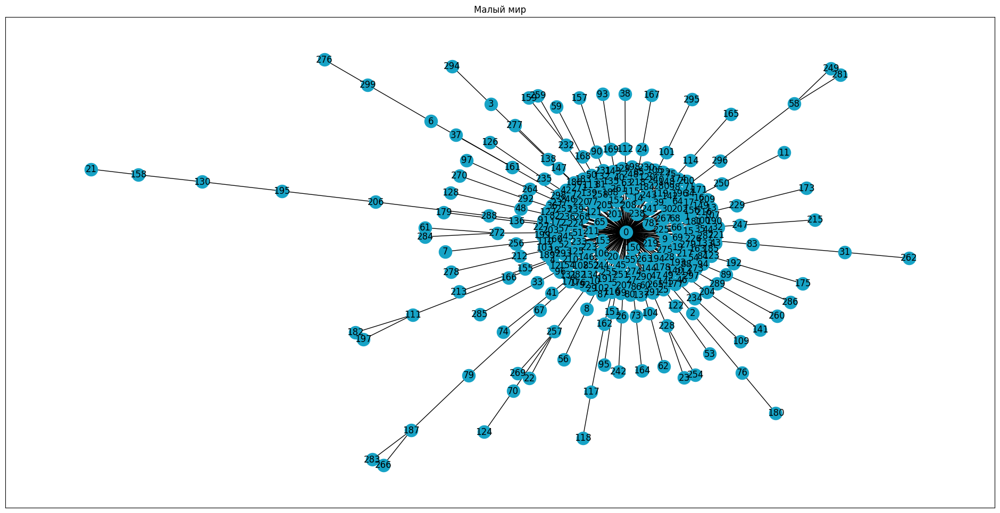

In [2]:
V = 300   # количество вершин
E = 70    # количество ребер
diameter = 10    # диаметр
max_load = 90    # предельная загрузка
mix_range_load = 5
max_range_load = 9

def create_graph():
    while True:
        G = nx.gnm_random_graph(V, E)
        subgraphs = list(nx.connected_components(G))
        for part in subgraphs[1:]:
            G.add_edge(list(subgraphs[0])[0], list(part)[0])
        if nx.diameter(G) == diameter:
            return G


G = create_graph()

# Генерация случайной текущей загрузки для вершин
for node in G.nodes:
    G.nodes[node]['load'] = random.randint(mix_range_load, max_range_load)


pos = nx.spring_layout(G)
plt.figure(figsize=(24, 12))
nx.draw_networkx(G, pos, node_color='#17a3c6')
plt.title("Малый мир")
plt.show()

In [3]:
nx.diameter(G)

10

In [4]:
nx.center(G)

[288]

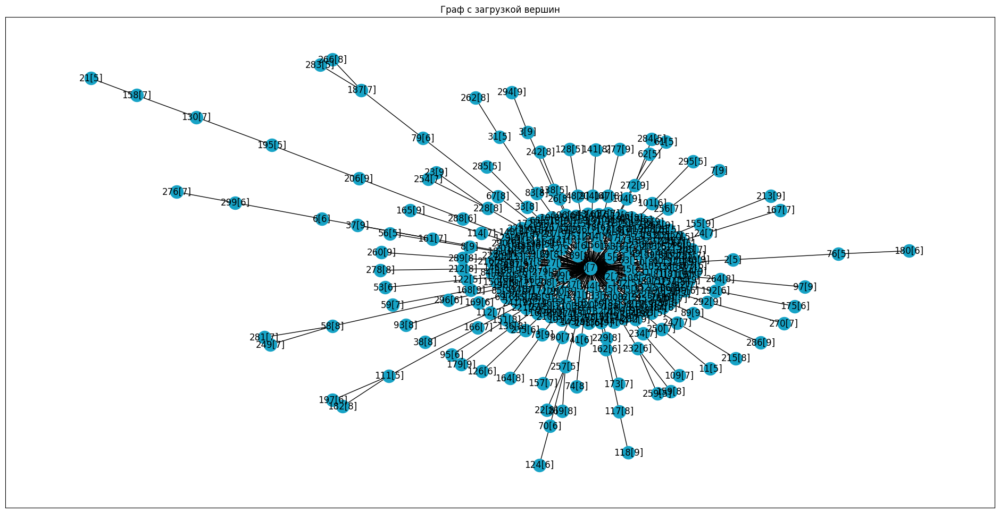

In [5]:
plt.figure(figsize=(24, 12))

labels = {}
for node in G.nodes():
  labels[node] = str(node) + "[" + str(G.nodes[node]['load']) + "]"
nx.draw_networkx(G, node_color='#17a3c6', labels=labels)
plt.title("Граф с загрузкой вершин")
plt.show()

In [6]:
def get_labels(G):
  values = []
  for i in G.nodes:
    values.append(f"{i} {[dict(G.nodes.data())[i]['load']]}")
    labels = dict(zip(list(dict(G.nodes.data()).keys()),values))
  return labels

In [7]:
def draw_graph(G, nodes_):
  plt.figure(figsize = (20, 14))
  labels = get_labels(G)
  pos = nx.spring_layout(G)

  if type(nodes_) is int:
    color_map = ['#FFF07C' if node == nodes_ else '#F0F7EE' for node in G.nodes]
  else:
    color_map = ['#A9DBB8' if node in nodes_ else '#F0F7EE' for node in G.nodes]

  nx.draw_networkx(G, pos, with_labels=True,labels=labels,node_color=color_map, node_size=600)
  plt.show()

2. Выберем одну начальную точку для разрушения графа и запуститим процесс разрушения. Засечем время начала и время завершения процесса разрушения:

In [8]:
import random as rnd
start_node = int(rnd.choice(list(G.nodes)))
start_node2 = start_node
print(f"Вершина ({start_node}) — загрузка [{G.nodes[start_node] ['load']}]\n")

Вершина (19) — загрузка [8]



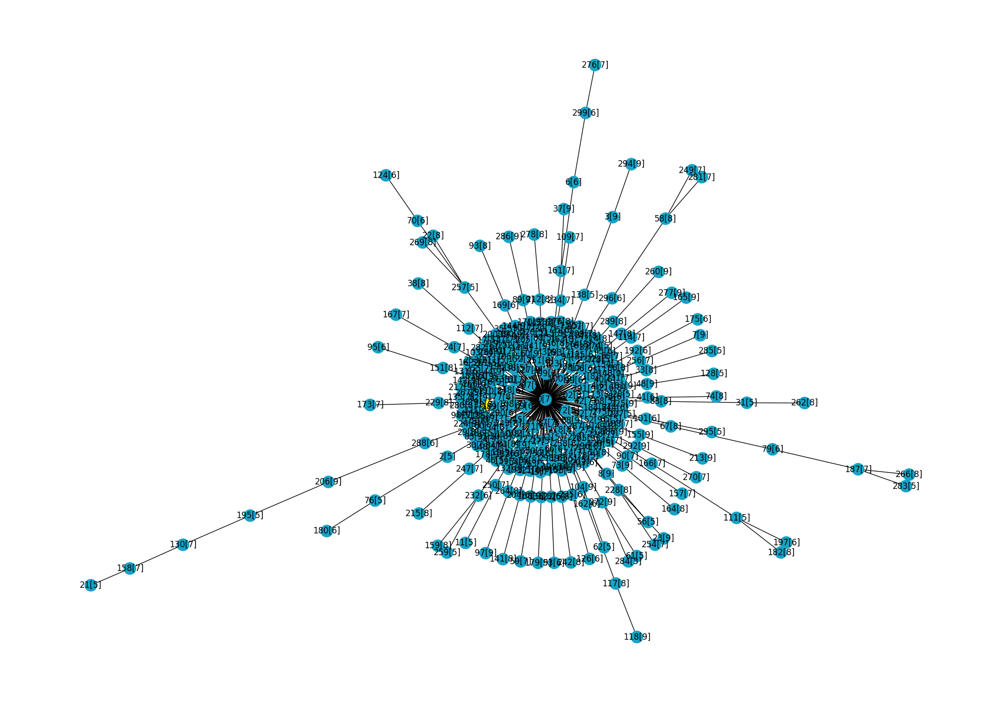

In [9]:
plt.figure(figsize = (20, 14))
color_map = []
for node in G:
    if node == start_node:
        color_map.append('yellow')
    else:
        color_map.append('#17a3c6')
labels = {}
for node in G.nodes():
  labels[node] = str(node) + "[" + str(G.nodes[node]['load']) + "]"
nx.draw(G, node_color=color_map, labels = labels, with_labels=True)

In [10]:
def changing_load(G, start_node):
    print('\nВершина -> ', start_node)
    neighbor_list = []
    if G.has_node(start_node) and G.nodes[start_node]['load'] >= max_load:
        neighbor_list = list(G.neighbors(start_node))
        size = len(neighbor_list)
        if size:
            load = round(G.nodes[start_node]['load'] / size)
            for neighbor in neighbor_list[:-1]:
                print(f"\t({neighbor}) {G.nodes[neighbor]['load']}-> { G.nodes[neighbor]['load'] + load}")
                G.nodes[neighbor]['load'] += load
            if size % 2 != 0:
                print(f"\t ({neighbor_list[-1]}) { G.nodes[neighbor_list[-1]]['load']} -> {G.nodes[neighbor_list[-1]]['load'] + load +  1}")
                G.nodes[neighbor_list[-1]]['load'] += load + 1
            else:
                print(f"\t ({neighbor_list[-1]}) { G.nodes[neighbor_list[-1]]['load']} -> {G.nodes[neighbor_list[-1]]['load'] + load}")
                G.nodes[neighbor_list[-1]]['load'] += load
        else:
            print('\tСтепень вершины — 0')
        G.remove_node(start_node)
        print(f'\tВершина {start_node} удалена')
    else:
        print('Загрузка меньше 90 или вершина не существует')
    return neighbor_list

In [11]:
print('Итерация 0\n**********')
neighbor_list = changing_load(G, start_node)

Итерация 0
**********

Вершина ->  19
Загрузка меньше 90 или вершина не существует


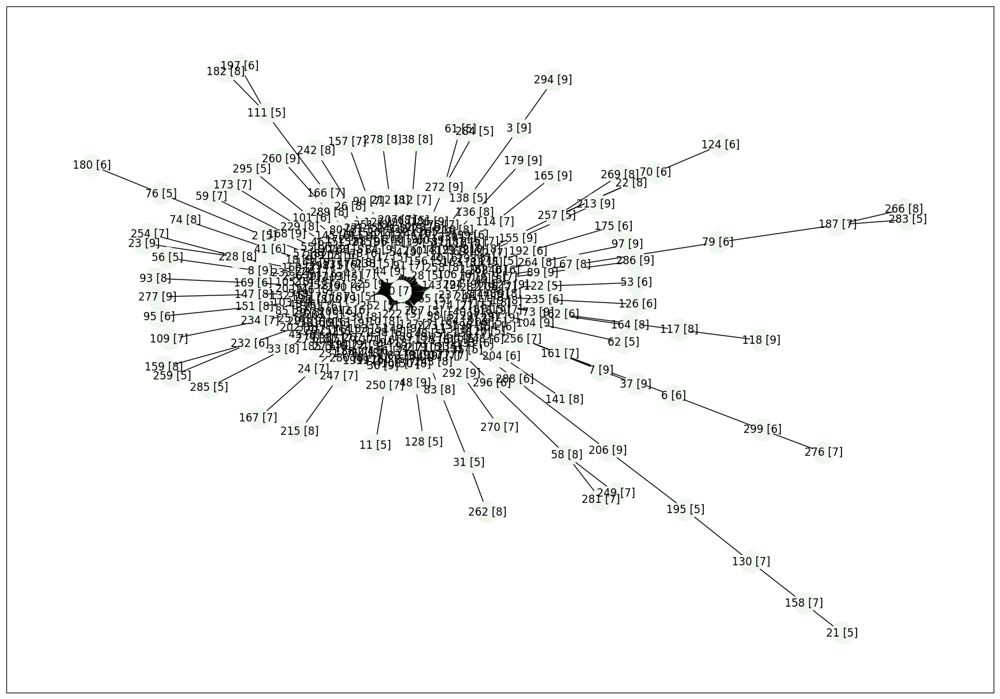

In [12]:
draw_graph(G, neighbor_list)

In [13]:
def iterations(G, neighbor_list):
    print('Работаем с ', neighbor_list)
    all_neighbor_list = []
    for idx, node in enumerate(neighbor_list):
        all_neighbor_list += changing_load(G, node)
    draw_graph(G, all_neighbor_list)
    return all_neighbor_list

Итерация  1 
**********



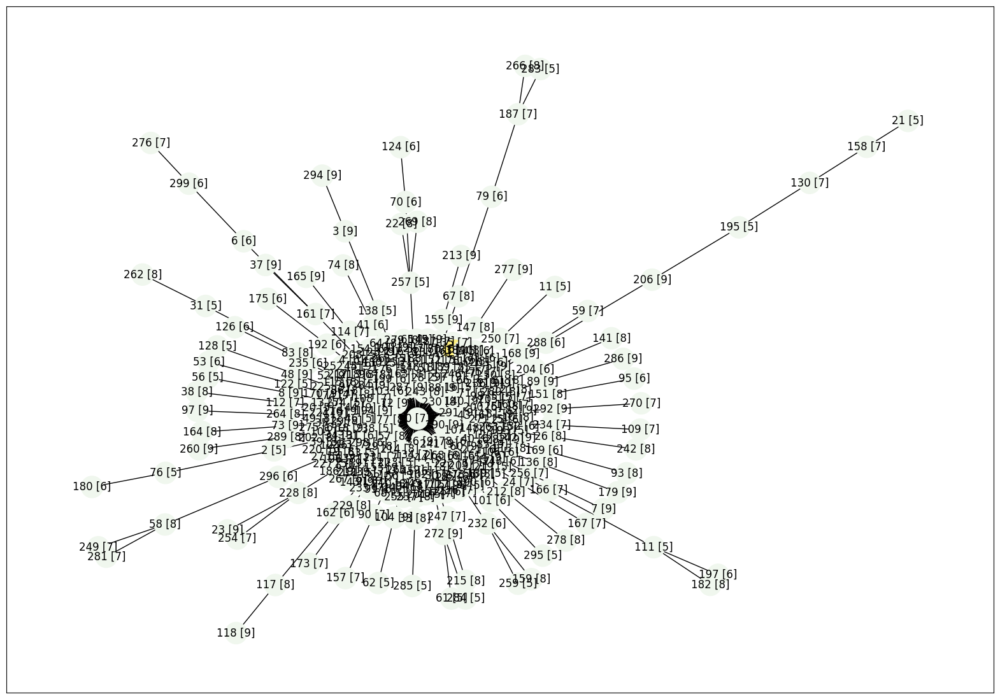


Вершина ->  183
	 (0) 7 -> 98
	Вершина 183 удалена
Работаем с  [0]

Вершина ->  0
	(264) 8-> 8
	(1) 8-> 8
	(2) 5-> 5
	(138) 5-> 5
	(4) 6-> 6
	(5) 9-> 9
	(161) 7-> 7
	(256) 7-> 7
	(8) 9-> 9
	(9) 7-> 7
	(10) 8-> 8
	(250) 7-> 7
	(12) 6-> 6
	(13) 5-> 5
	(14) 9-> 9
	(15) 7-> 7
	(16) 5-> 5
	(17) 5-> 5
	(18) 9-> 9
	(19) 8-> 8
	(20) 5-> 5
	(288) 6-> 6
	(257) 5-> 5
	(228) 8-> 8
	(24) 7-> 7
	(25) 6-> 6
	(26) 8-> 8
	(27) 5-> 5
	(28) 5-> 5
	(29) 8-> 8
	(30) 6-> 6
	(83) 8-> 8
	(32) 7-> 7
	(33) 8-> 8
	(34) 9-> 9
	(35) 5-> 5
	(36) 9-> 9
	(112) 7-> 7
	(39) 8-> 8
	(40) 6-> 6
	(41) 6-> 6
	(42) 7-> 7
	(43) 6-> 6
	(44) 9-> 9
	(45) 6-> 6
	(46) 5-> 5
	(47) 8-> 8
	(48) 9-> 9
	(49) 8-> 8
	(50) 8-> 8
	(51) 7-> 7
	(52) 9-> 9
	(122) 5-> 5
	(54) 9-> 9
	(55) 7-> 7
	(57) 8-> 8
	(296) 6-> 6
	(168) 9-> 9
	(60) 9-> 9
	(272) 9-> 9
	(104) 9-> 9
	(63) 5-> 5
	(64) 8-> 8
	(65) 5-> 5
	(66) 6-> 6
	(67) 8-> 8
	(68) 5-> 5
	(69) 6-> 6
	(71) 5-> 5
	(72) 9-> 9
	(73) 9-> 9
	(75) 7-> 7
	(77) 7-> 7
	(78) 6-> 6
	(80) 5-> 5
	(81) 8->

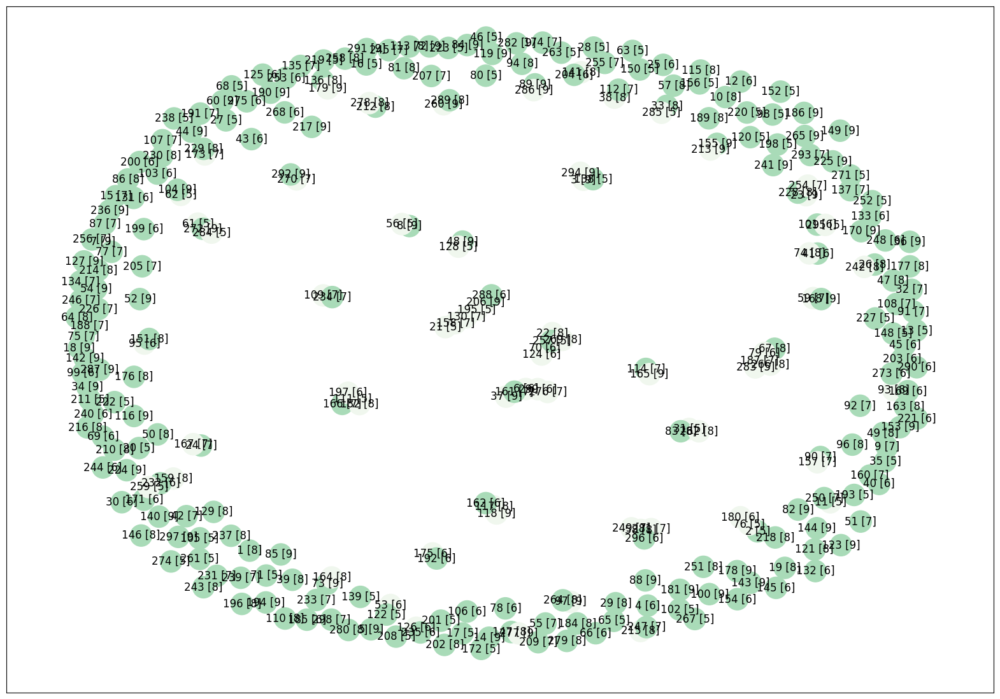


Итерация  2 
**********

Работаем с  [264, 1, 2, 138, 4, 5, 161, 256, 8, 9, 10, 250, 12, 13, 14, 15, 16, 17, 18, 19, 20, 288, 257, 228, 24, 25, 26, 27, 28, 29, 30, 83, 32, 33, 34, 35, 36, 112, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 122, 54, 55, 57, 296, 168, 60, 272, 104, 63, 64, 65, 66, 67, 68, 69, 71, 72, 73, 75, 77, 78, 80, 81, 82, 84, 85, 86, 87, 88, 89, 90, 91, 92, 169, 94, 151, 96, 98, 99, 100, 101, 102, 103, 105, 106, 107, 108, 234, 110, 166, 113, 114, 115, 116, 162, 119, 120, 121, 123, 125, 235, 127, 129, 131, 132, 133, 134, 135, 136, 137, 139, 140, 204, 142, 143, 144, 145, 146, 147, 148, 149, 150, 152, 153, 154, 155, 156, 232, 160, 163, 170, 171, 172, 229, 174, 192, 176, 177, 178, 181, 184, 185, 186, 188, 189, 190, 191, 193, 194, 196, 198, 199, 200, 201, 202, 203, 205, 207, 208, 209, 210, 211, 212, 214, 247, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 230, 231, 233, 236, 237, 238, 239, 240, 241, 243, 244, 245, 246, 248, 251, 252, 253, 255, 258

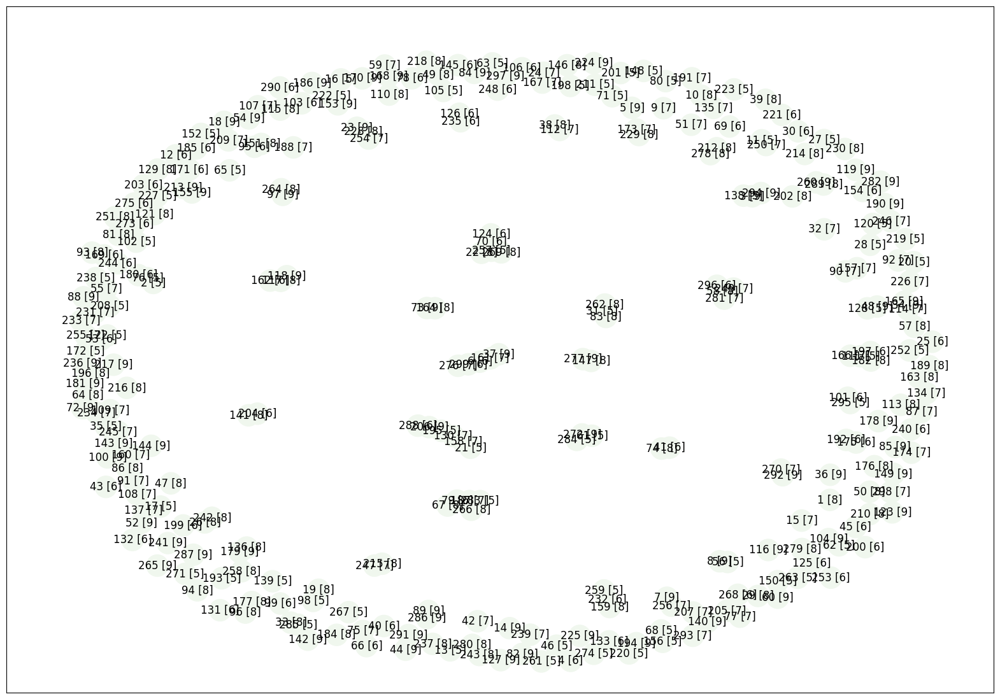


Итерация  3 
**********



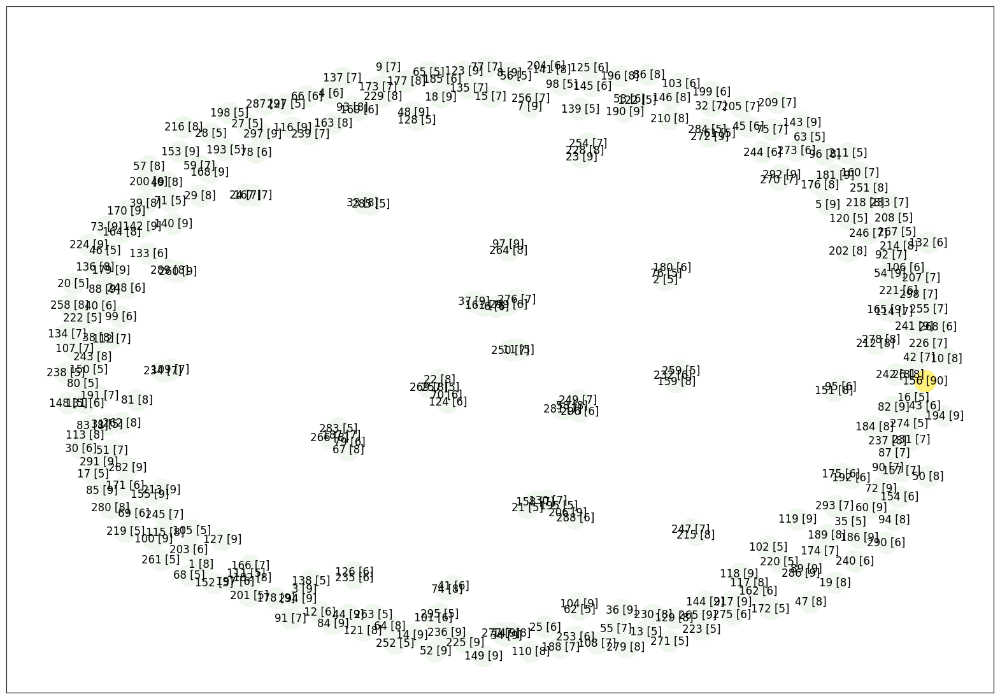


Вершина ->  156
	Степень вершины — 0
	Вершина 156 удалена
Работаем с  []


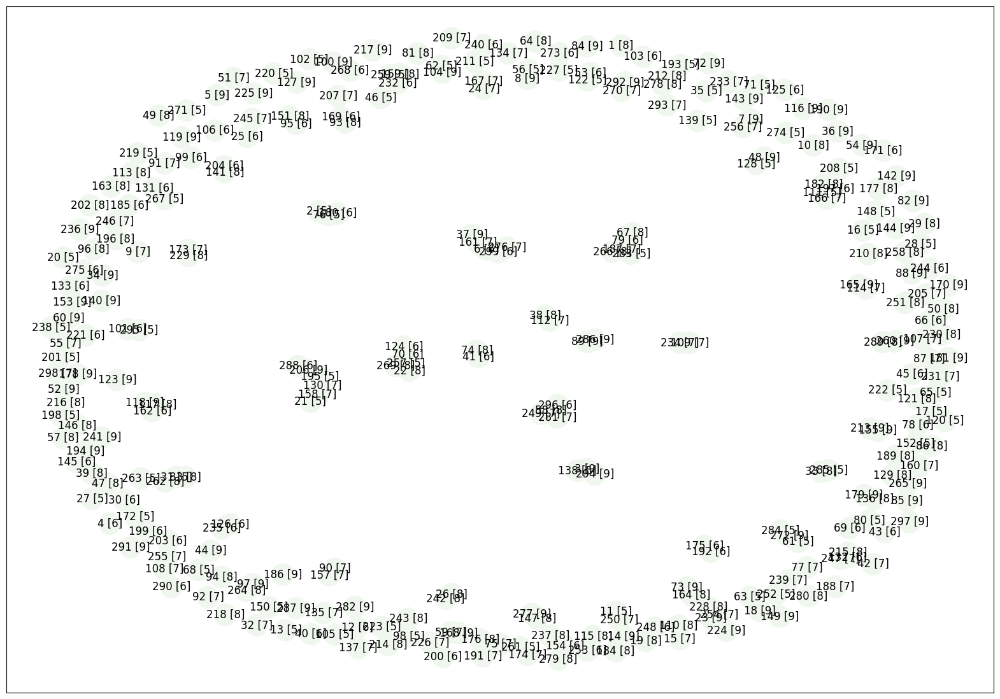


Итерация  4 
**********



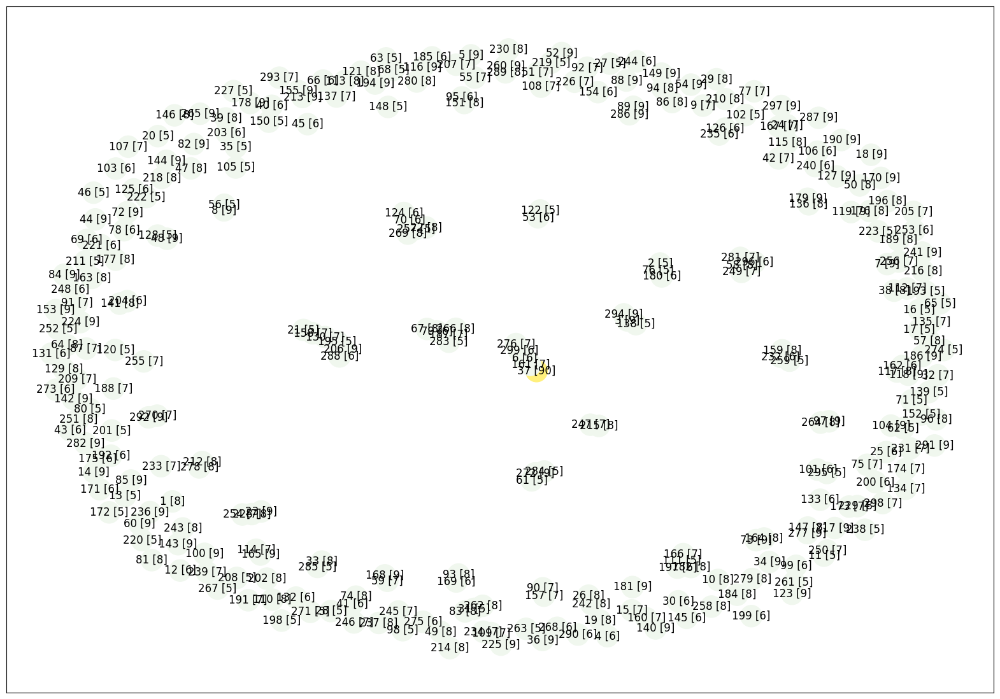


Вершина ->  37
	 (161) 7 -> 98
	Вершина 37 удалена
Работаем с  [161]

Вершина ->  161
	 (6) 6 -> 105
	Вершина 161 удалена


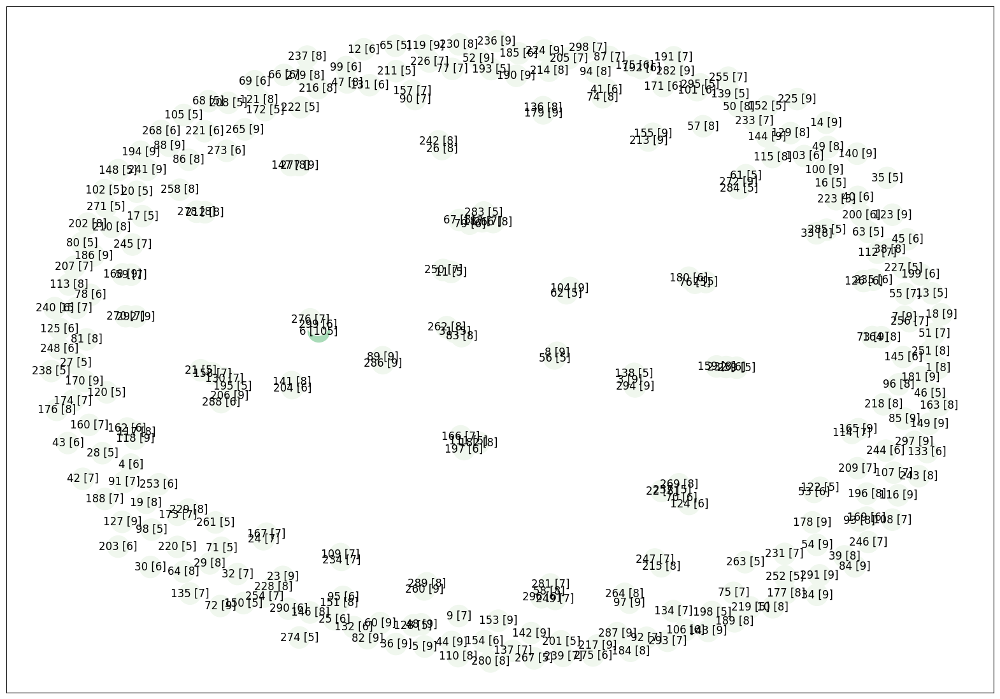


Итерация  5 
**********

Работаем с  [6]

Вершина ->  6
	 (299) 6 -> 112
	Вершина 6 удалена


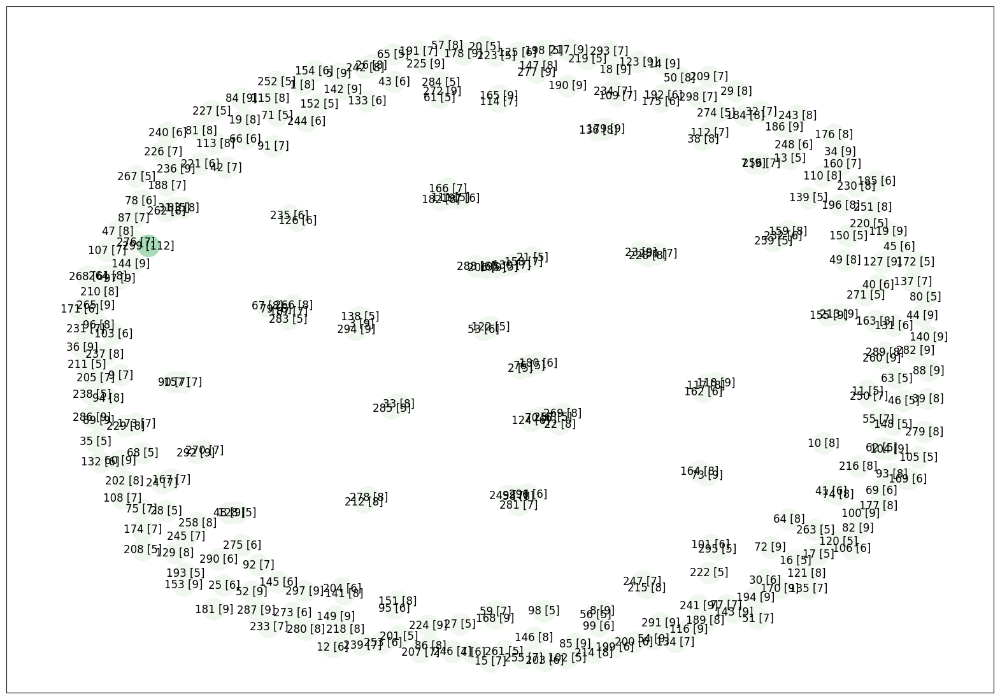


Итерация  6 
**********

Работаем с  [299]

Вершина ->  299
	 (276) 7 -> 120
	Вершина 299 удалена


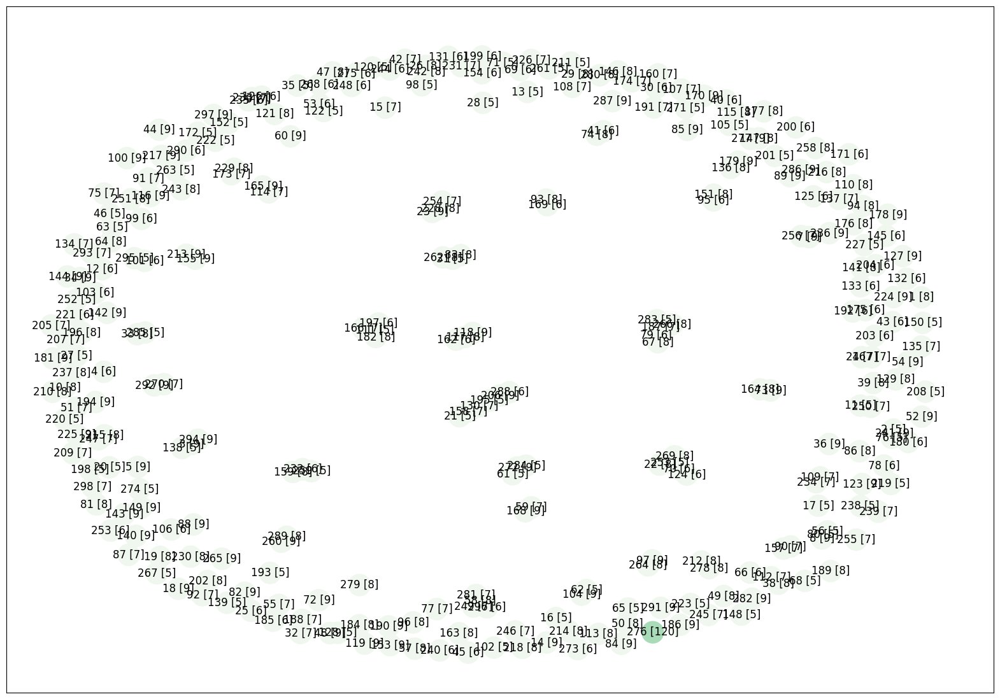


Итерация  7 
**********

Работаем с  [276]

Вершина ->  276
	Степень вершины — 0
	Вершина 276 удалена


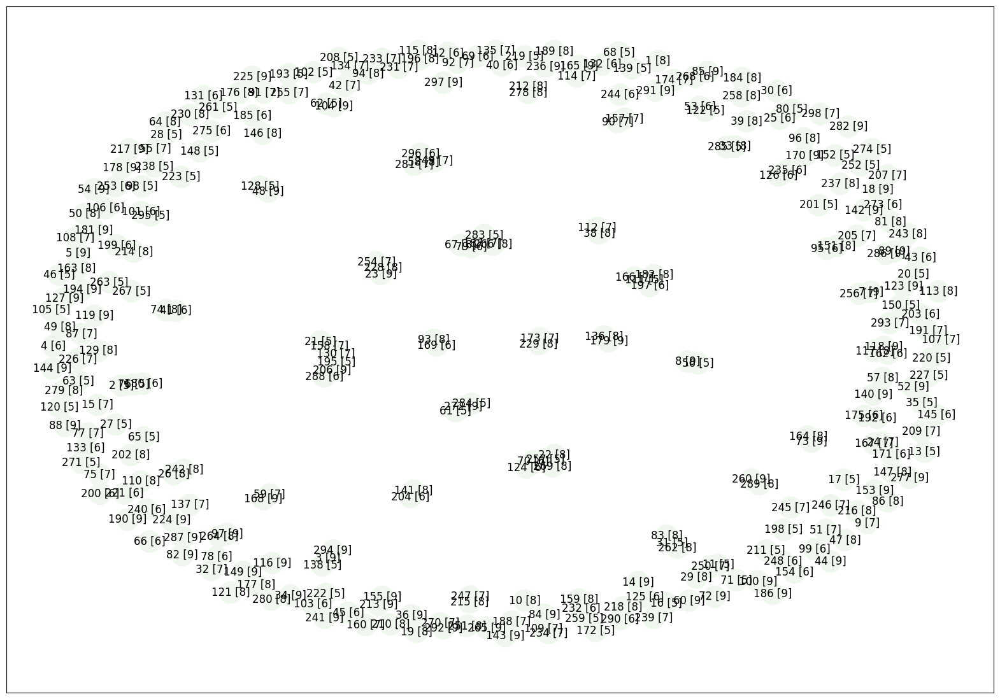


Итерация  8 
**********



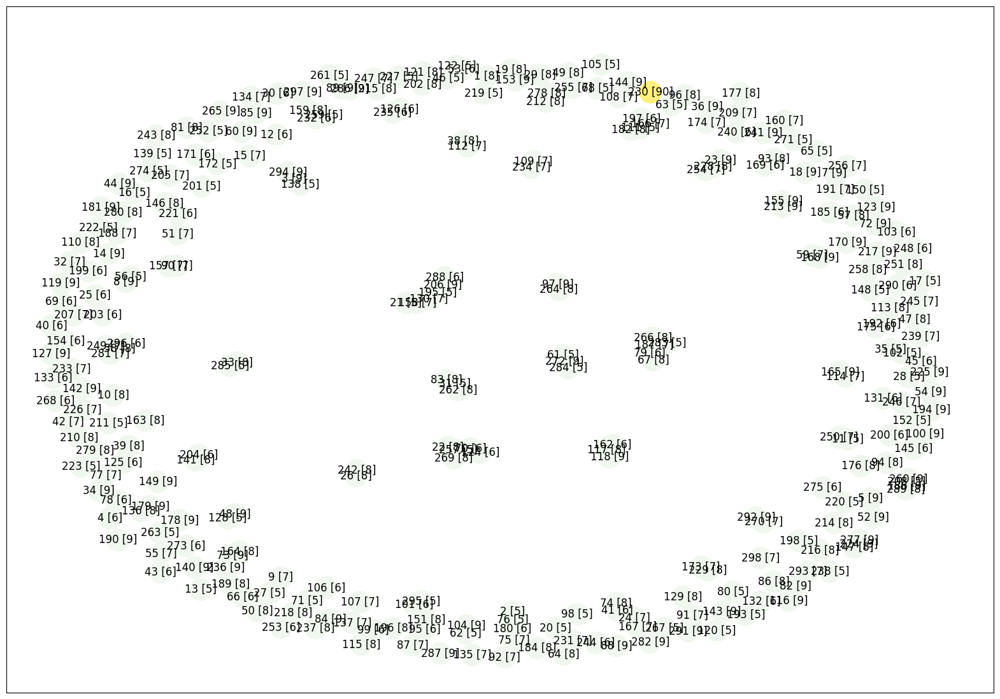


Вершина ->  230
	Степень вершины — 0
	Вершина 230 удалена
Работаем с  []


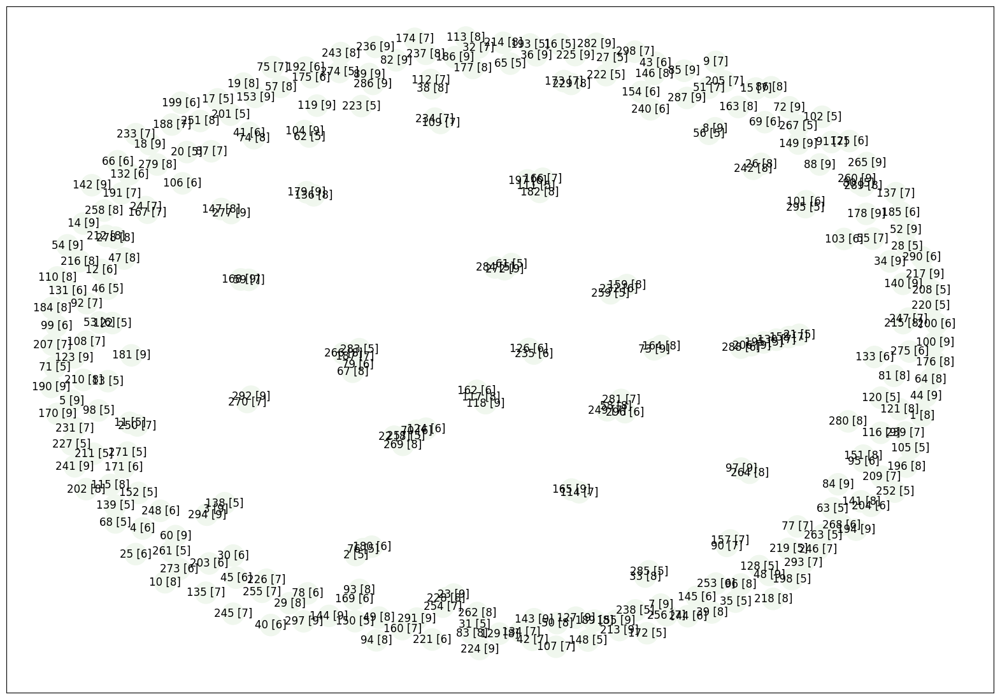


Итерация  9 
**********



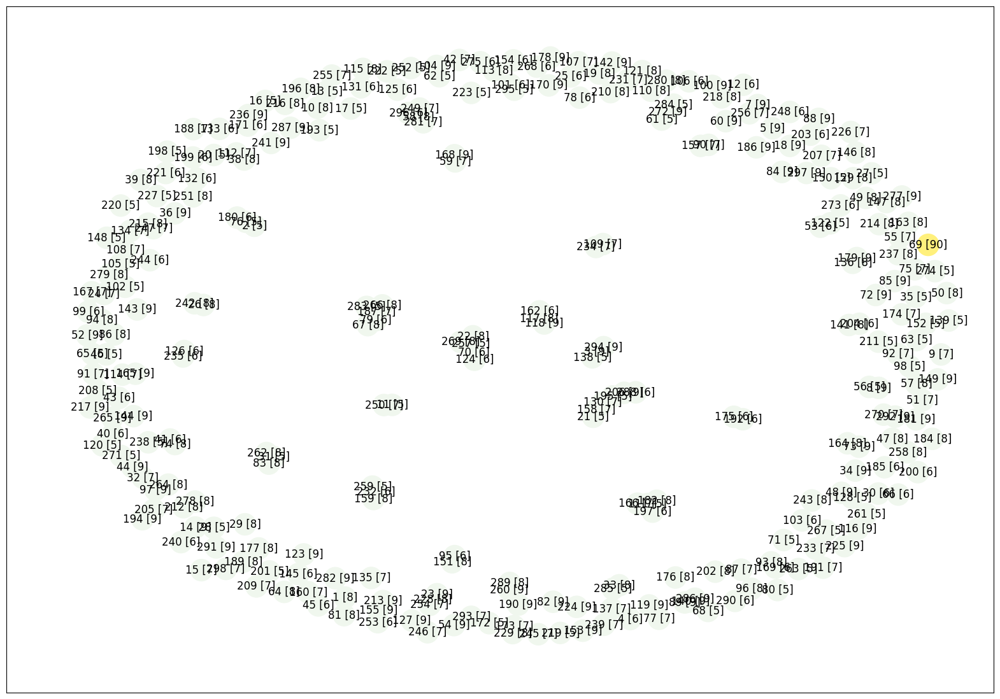


Вершина ->  69
	Степень вершины — 0
	Вершина 69 удалена
Работаем с  []


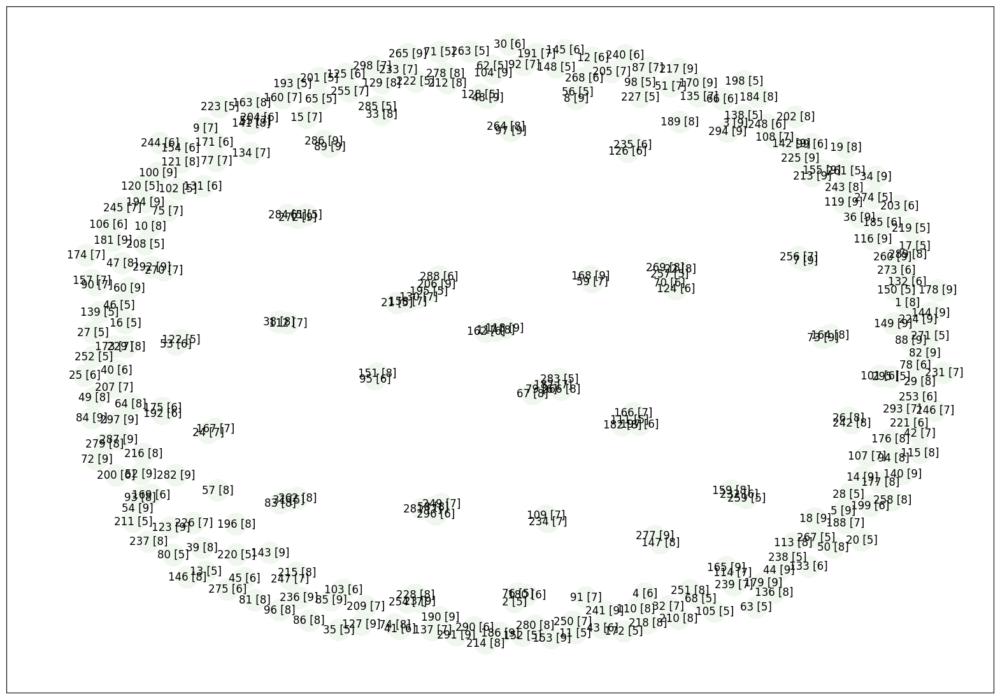

In [14]:
start_time_one_point = time.time()

G_copy = G.copy()
sigma1, sigma2 = 0, 0
for iterr in range(1, 10):
    print('Итерация ', iterr, '\n**********\n')
    if not neighbor_list:
        start_node = int(random.choice(list(G_copy.nodes)))
        G_copy.nodes[start_node]['load'] = max_load
        draw_graph(G_copy, start_node)
        neighbor_list = changing_load(G_copy, start_node)
    if nx.is_empty(G_copy):
        sigma1 = iterr
        break
    if not nx.is_connected(G_copy):
        sigma2 = iterr
    result_neighbor_list = iterations(G_copy, neighbor_list)
    neighbor_list = result_neighbor_list.copy()
    print()

end_time_one_point = time.time()
time_one_point = end_time_one_point - start_time_one_point

3. Выберем три начальных точки для разрушения графа и запуститим процесс разрушения:

In [15]:
import random as rnd
start_nodes = rnd.sample(list(G.nodes), 3)
print(start_nodes)

for start_node in start_nodes:
    G.nodes[start_node]['load'] = max_load
    print(f"Вершина ({start_node}) — загрузка [{G.nodes[start_node]['load']}]\n")

[100, 275, 107]
Вершина (100) — загрузка [90]

Вершина (275) — загрузка [90]

Вершина (107) — загрузка [90]



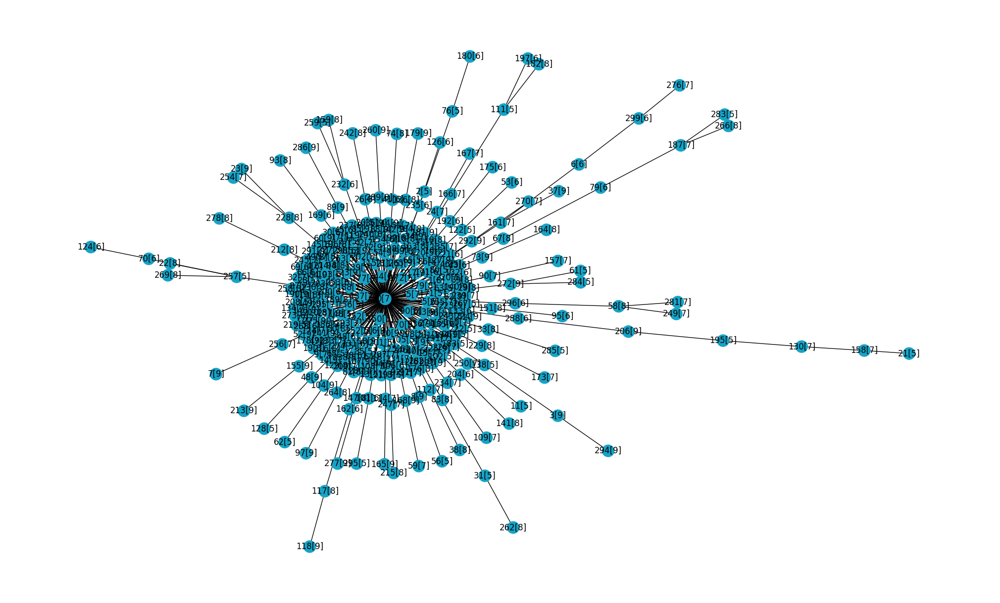

In [16]:
plt.figure(figsize = (20, 12))
color_map = []
for node in G:
    if node == start_nodes:
        color_map.append('yellow')
    else:
        color_map.append('#17a3c6')
labels = {}
for node in G.nodes():
    labels[node] = str(node) + "[" + str(G.nodes[node]['load']) + "]"
nx.draw(G, node_color=color_map, labels = labels, with_labels=True)

In [17]:
def changing_load(G, start_nodes):
    all_neighbor_list = []
    for start_node in start_nodes:
        print('\nВершина ->', start_node)
        neighbor_list = []
        if G.has_node(start_node) and G.nodes[start_node]['load'] >= max_load:
            neighbor_list = list(G.neighbors(start_node))
            size = len(neighbor_list)
            if size:
                load = round(G.nodes[start_node]['load'] / size)
                for neighbor in neighbor_list[:-1]:
                    print(f"\t({neighbor}) {G.nodes[neighbor]['load']} -> {G.nodes[neighbor]['load'] + load}")
                    G.nodes[neighbor]['load'] += load
                if size % 2 != 0:
                    print(f"\t({neighbor_list[-1]}) {G.nodes[neighbor_list[-1]]['load']} -> "
                          f"{G.nodes[neighbor_list[-1]]['load'] + load + 1}")
                    G.nodes[neighbor_list[-1]]['load'] += load + 1
                else:
                    print(f"\t({neighbor_list[-1]}) {G.nodes[neighbor_list[-1]]['load']} -> "
                          f"{G.nodes[neighbor_list[-1]]['load'] + load}")
                    G.nodes[neighbor_list[-1]]['load'] += load
            else:
                print('\tСтепень вершины — 0')
            G.remove_node(start_node)
            print(f'\tВершина {start_node} удалена')
            all_neighbor_list.extend(neighbor_list)
        else:
            print('Загрузка меньше 90 или вершина не существует')
    return all_neighbor_list


print('Итерация 0\n**********')
neighbor_list = changing_load(G, start_nodes)

Итерация 0
**********

Вершина -> 100
	(0) 7 -> 98
	Вершина 100 удалена

Вершина -> 275
	(0) 98 -> 189
	Вершина 275 удалена

Вершина -> 107
	(0) 189 -> 280
	Вершина 107 удалена


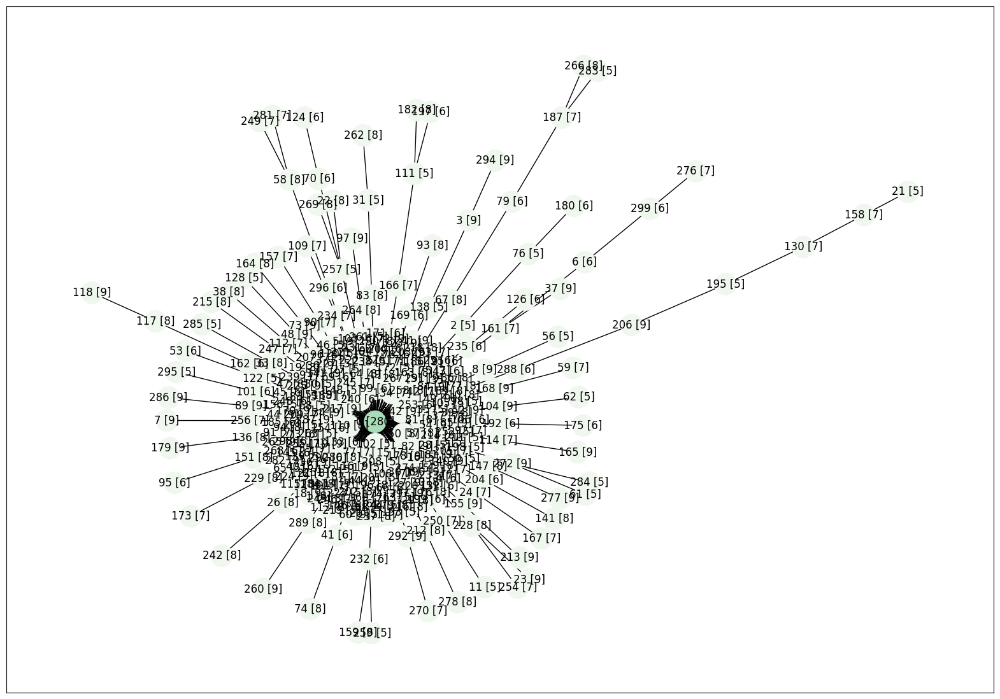

In [18]:
draw_graph(G, neighbor_list)

Итерация  1 
**********

Работаем с  [0, 0, 0]

Вершина -> 0
	(264) 8 -> 9
	(1) 8 -> 9
	(2) 5 -> 6
	(138) 5 -> 6
	(4) 6 -> 7
	(5) 9 -> 10
	(161) 7 -> 8
	(256) 7 -> 8
	(8) 9 -> 10
	(9) 7 -> 8
	(10) 8 -> 9
	(250) 7 -> 8
	(12) 6 -> 7
	(13) 5 -> 6
	(14) 9 -> 10
	(15) 7 -> 8
	(16) 5 -> 6
	(17) 5 -> 6
	(18) 9 -> 10
	(19) 8 -> 9
	(20) 5 -> 6
	(288) 6 -> 7
	(257) 5 -> 6
	(228) 8 -> 9
	(24) 7 -> 8
	(25) 6 -> 7
	(26) 8 -> 9
	(27) 5 -> 6
	(28) 5 -> 6
	(29) 8 -> 9
	(30) 6 -> 7
	(83) 8 -> 9
	(32) 7 -> 8
	(33) 8 -> 9
	(34) 9 -> 10
	(35) 5 -> 6
	(36) 9 -> 10
	(112) 7 -> 8
	(39) 8 -> 9
	(40) 6 -> 7
	(41) 6 -> 7
	(42) 7 -> 8
	(43) 6 -> 7
	(44) 9 -> 10
	(45) 6 -> 7
	(46) 5 -> 6
	(47) 8 -> 9
	(48) 9 -> 10
	(49) 8 -> 9
	(50) 8 -> 9
	(51) 7 -> 8
	(52) 9 -> 10
	(122) 5 -> 6
	(54) 9 -> 10
	(55) 7 -> 8
	(57) 8 -> 9
	(296) 6 -> 7
	(168) 9 -> 10
	(60) 9 -> 10
	(272) 9 -> 10
	(104) 9 -> 10
	(63) 5 -> 6
	(64) 8 -> 9
	(65) 5 -> 6
	(66) 6 -> 7
	(67) 8 -> 9
	(68) 5 -> 6
	(69) 6 -> 7
	(71) 5 -> 6
	(72) 9 -> 10
	(73) 

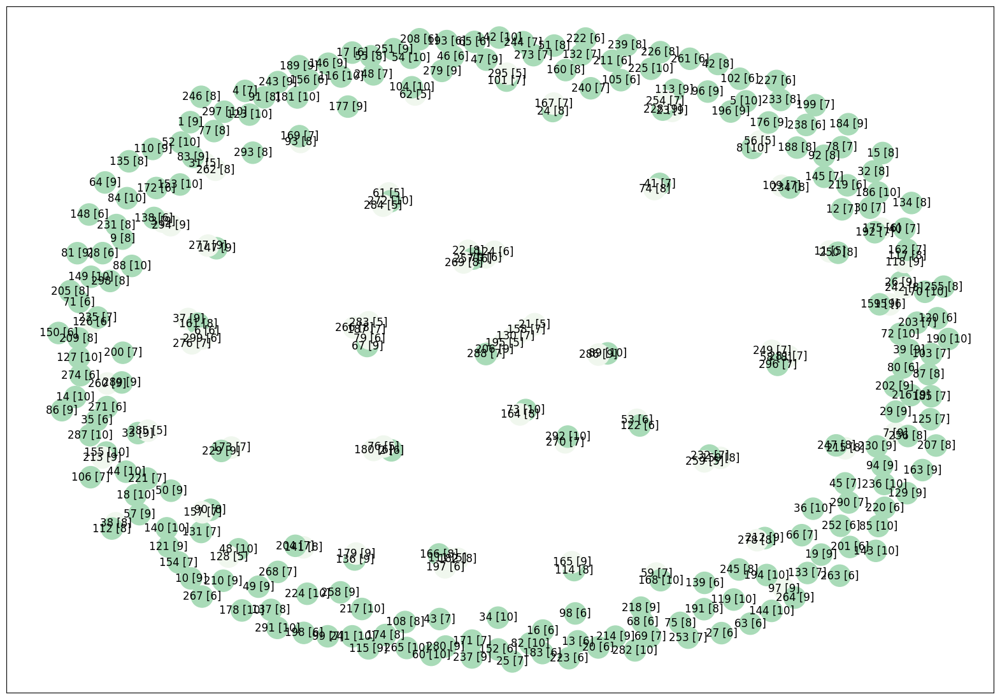


Итерация  2 
**********

Работаем с  [264, 1, 2, 138, 4, 5, 161, 256, 8, 9, 10, 250, 12, 13, 14, 15, 16, 17, 18, 19, 20, 288, 257, 228, 24, 25, 26, 27, 28, 29, 30, 83, 32, 33, 34, 35, 36, 112, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 122, 54, 55, 57, 296, 168, 60, 272, 104, 63, 64, 65, 66, 67, 68, 69, 71, 72, 73, 75, 77, 78, 80, 81, 82, 84, 85, 86, 87, 88, 89, 90, 91, 92, 169, 94, 151, 96, 98, 99, 101, 102, 103, 105, 106, 108, 234, 110, 166, 113, 114, 115, 116, 162, 119, 120, 121, 123, 125, 235, 127, 129, 131, 132, 133, 134, 135, 136, 137, 139, 140, 204, 142, 143, 144, 145, 146, 147, 148, 149, 150, 152, 153, 154, 155, 156, 232, 160, 163, 170, 171, 172, 229, 174, 192, 176, 177, 178, 181, 183, 184, 185, 186, 188, 189, 190, 191, 193, 194, 196, 198, 199, 200, 201, 202, 203, 205, 207, 208, 209, 210, 211, 212, 214, 247, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 230, 231, 233, 236, 237, 238, 239, 240, 241, 243, 244, 245, 246, 248, 251, 252, 253, 255, 258, 289

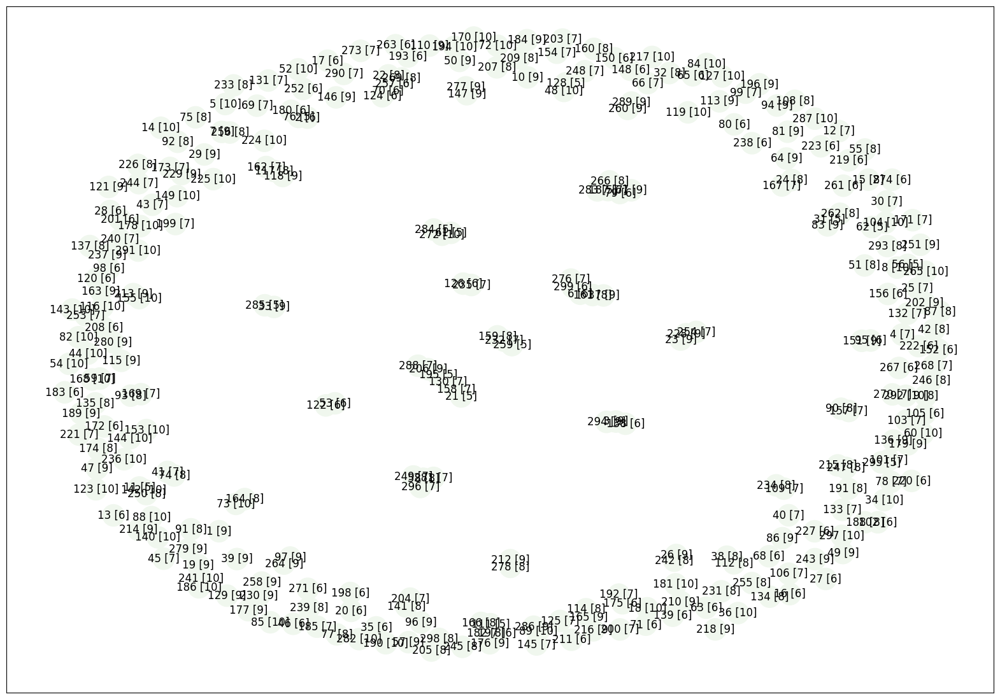


Итерация  3 
**********



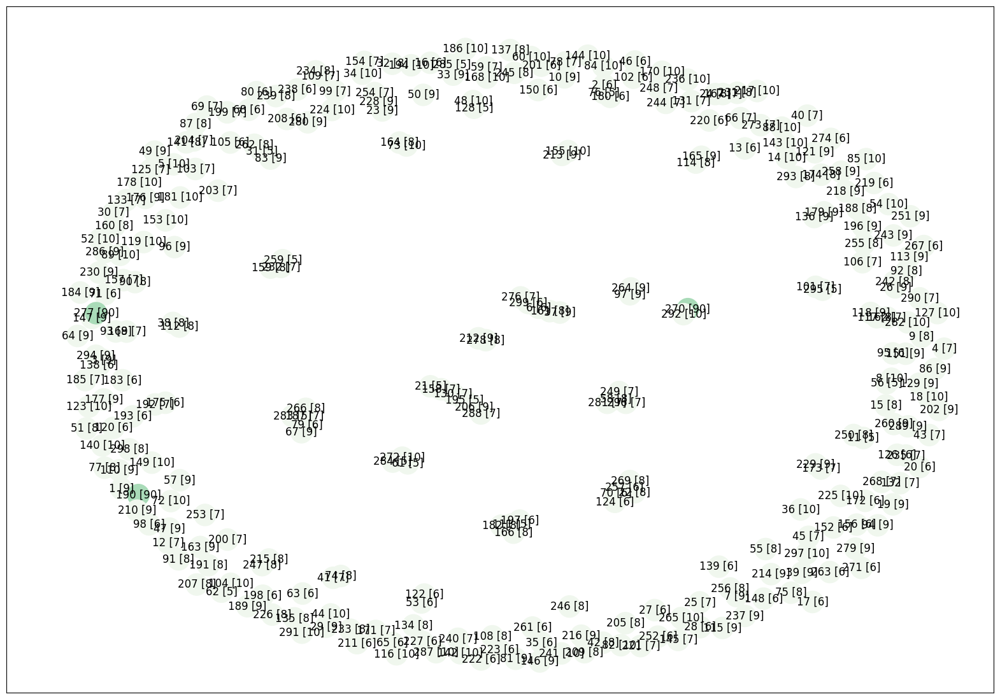


Вершина -> 190
	Степень вершины — 0
	Вершина 190 удалена

Вершина -> 277
	(147) 9 -> 100
	Вершина 277 удалена

Вершина -> 270
	(292) 10 -> 101
	Вершина 270 удалена
Работаем с  [147, 292]

Вершина -> 147
	Степень вершины — 0
	Вершина 147 удалена

Вершина -> 292
	Степень вершины — 0
	Вершина 292 удалена


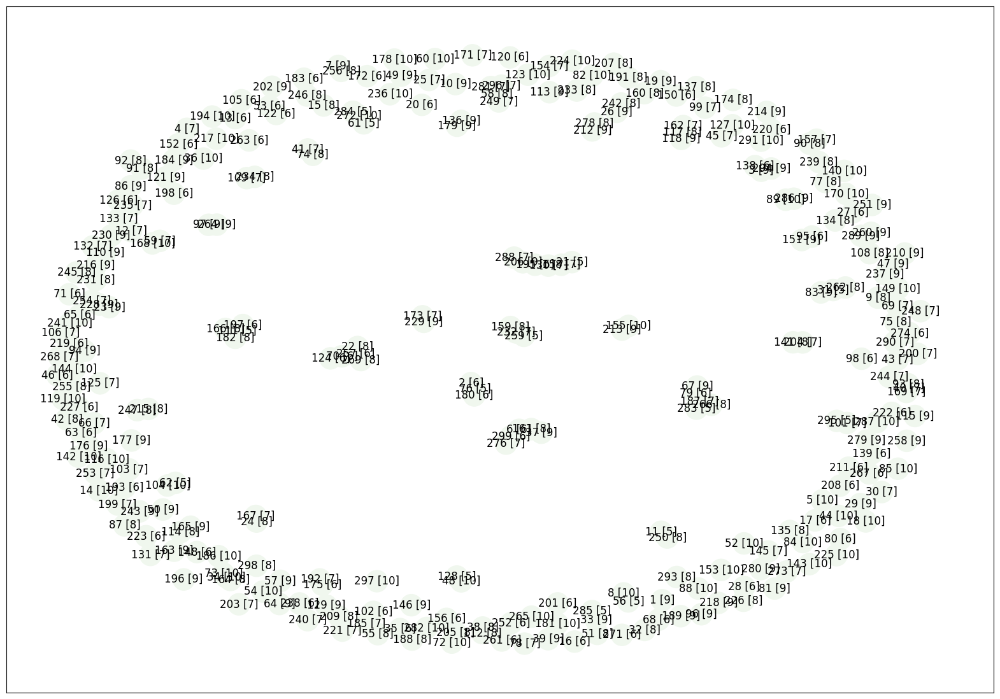


Итерация  4 
**********



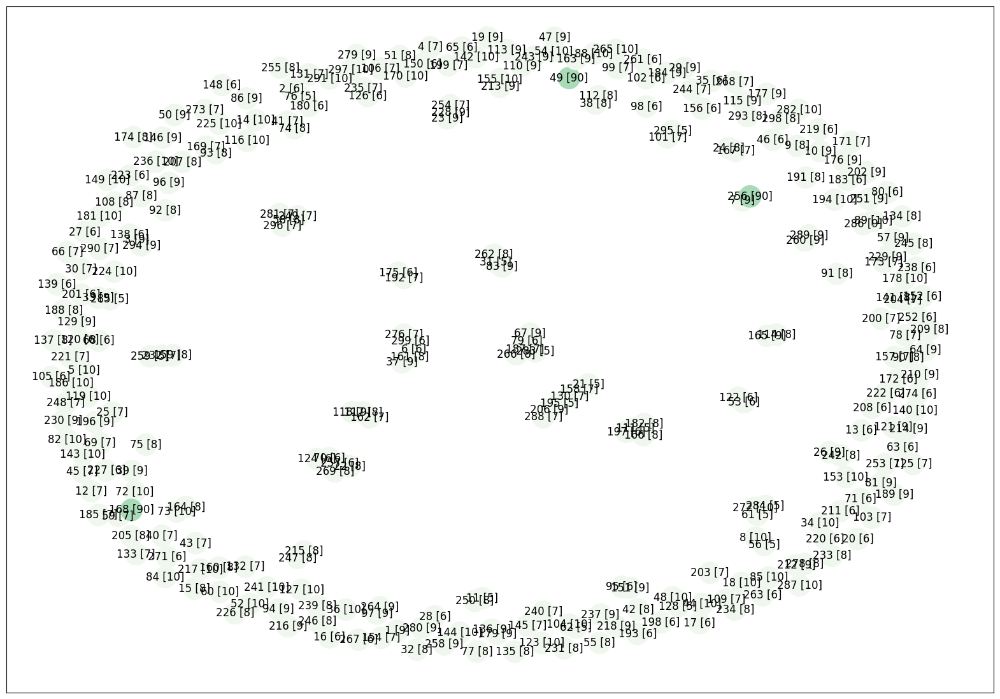


Вершина -> 49
	Степень вершины — 0
	Вершина 49 удалена

Вершина -> 168
	(59) 7 -> 98
	Вершина 168 удалена

Вершина -> 256
	(7) 9 -> 100
	Вершина 256 удалена
Работаем с  [59, 7]

Вершина -> 59
	Степень вершины — 0
	Вершина 59 удалена

Вершина -> 7
	Степень вершины — 0
	Вершина 7 удалена


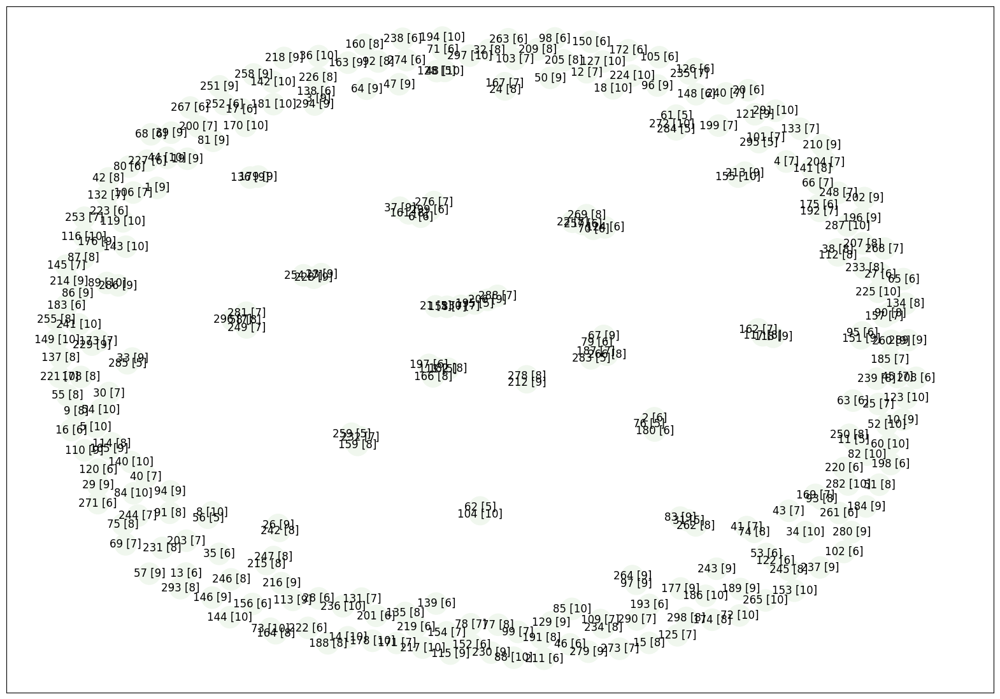


Итерация  5 
**********



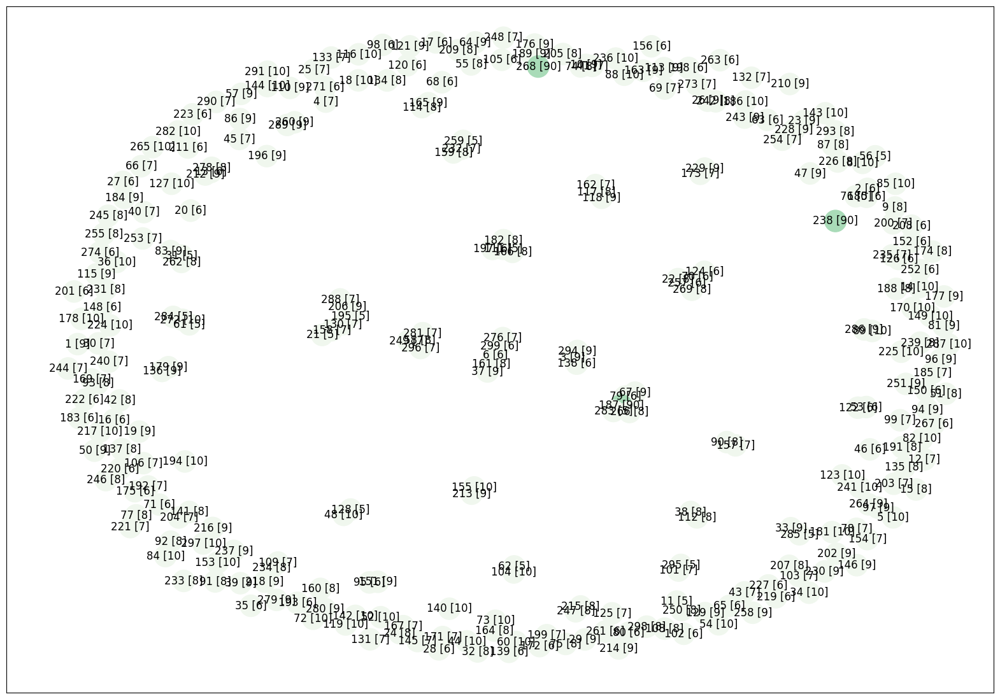


Вершина -> 238
	Степень вершины — 0
	Вершина 238 удалена

Вершина -> 187
	(79) 6 -> 36
	(266) 8 -> 38
	(283) 5 -> 36
	Вершина 187 удалена

Вершина -> 268
	Степень вершины — 0
	Вершина 268 удалена
Работаем с  [79, 266, 283]

Вершина -> 79
Загрузка меньше 90 или вершина не существует

Вершина -> 266
Загрузка меньше 90 или вершина не существует

Вершина -> 283
Загрузка меньше 90 или вершина не существует


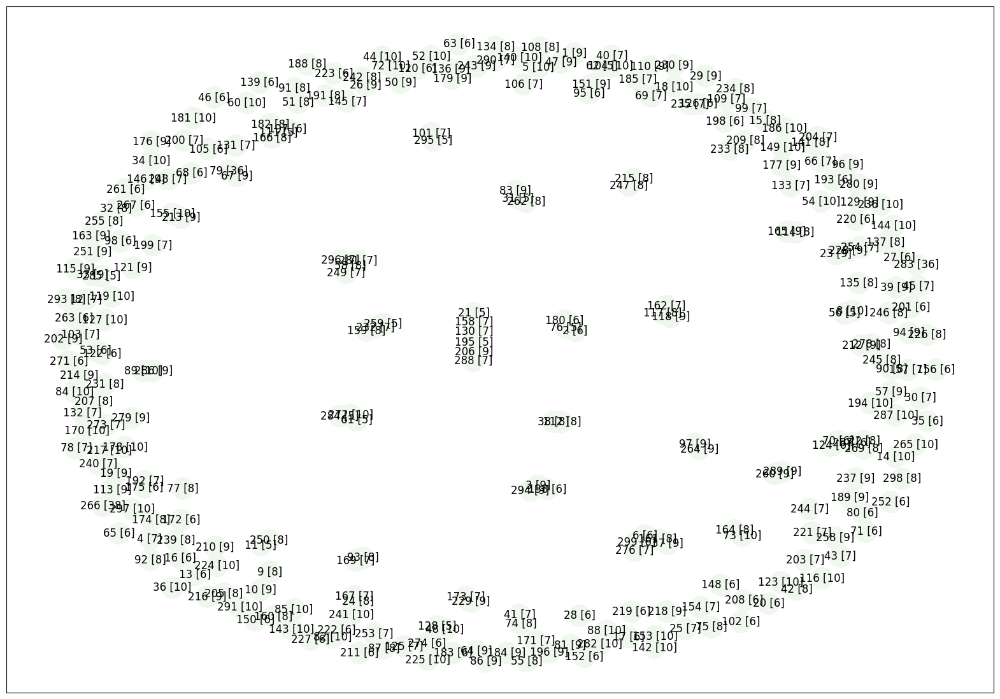


Итерация  6 
**********



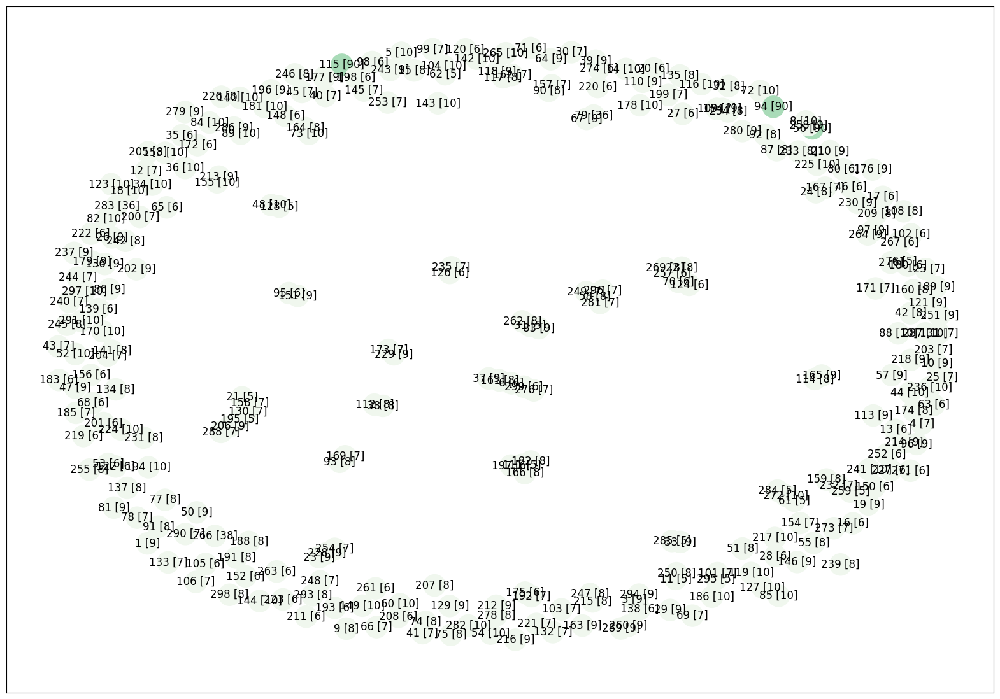


Вершина -> 94
	Степень вершины — 0
	Вершина 94 удалена

Вершина -> 56
	(8) 10 -> 101
	Вершина 56 удалена

Вершина -> 115
	Степень вершины — 0
	Вершина 115 удалена
Работаем с  [8]

Вершина -> 8
	Степень вершины — 0
	Вершина 8 удалена


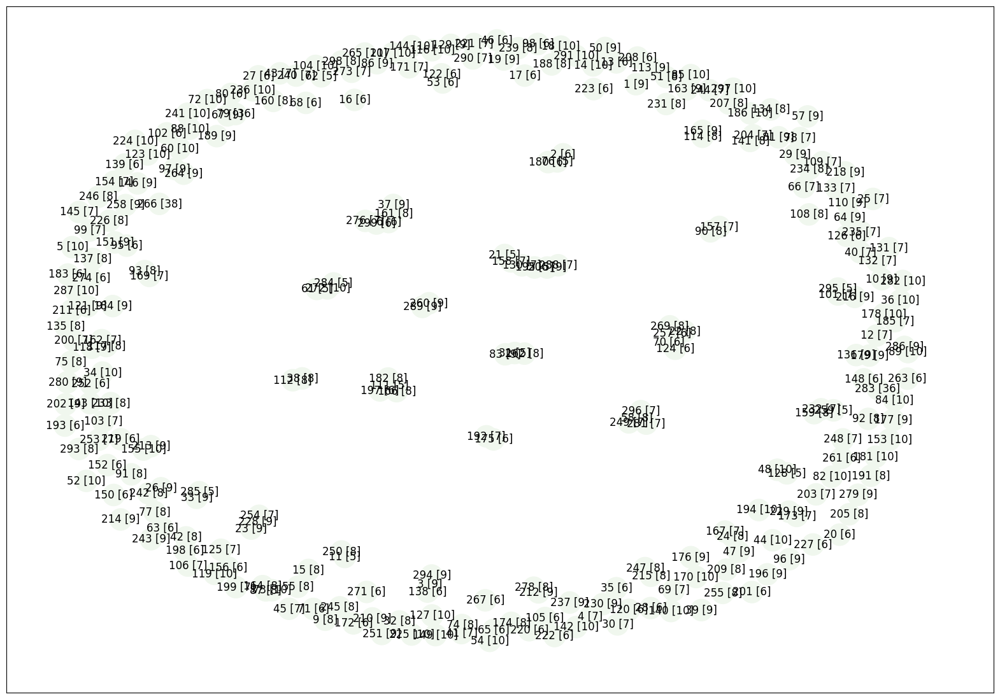


Итерация  7 
**********



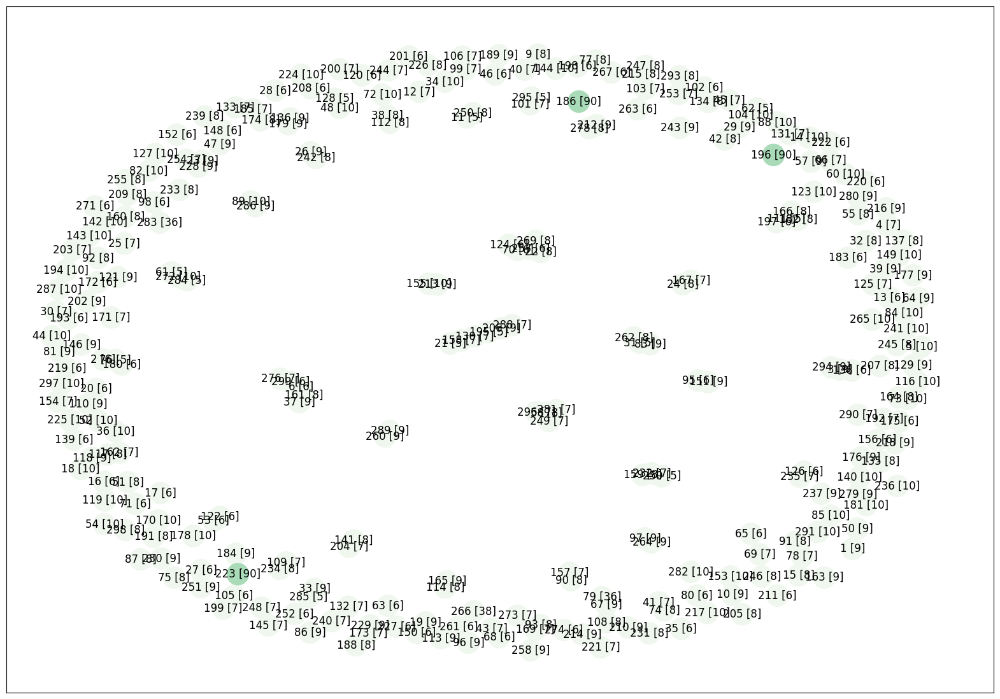


Вершина -> 196
	Степень вершины — 0
	Вершина 196 удалена

Вершина -> 223
	Степень вершины — 0
	Вершина 223 удалена

Вершина -> 186
	Степень вершины — 0
	Вершина 186 удалена
Работаем с  []


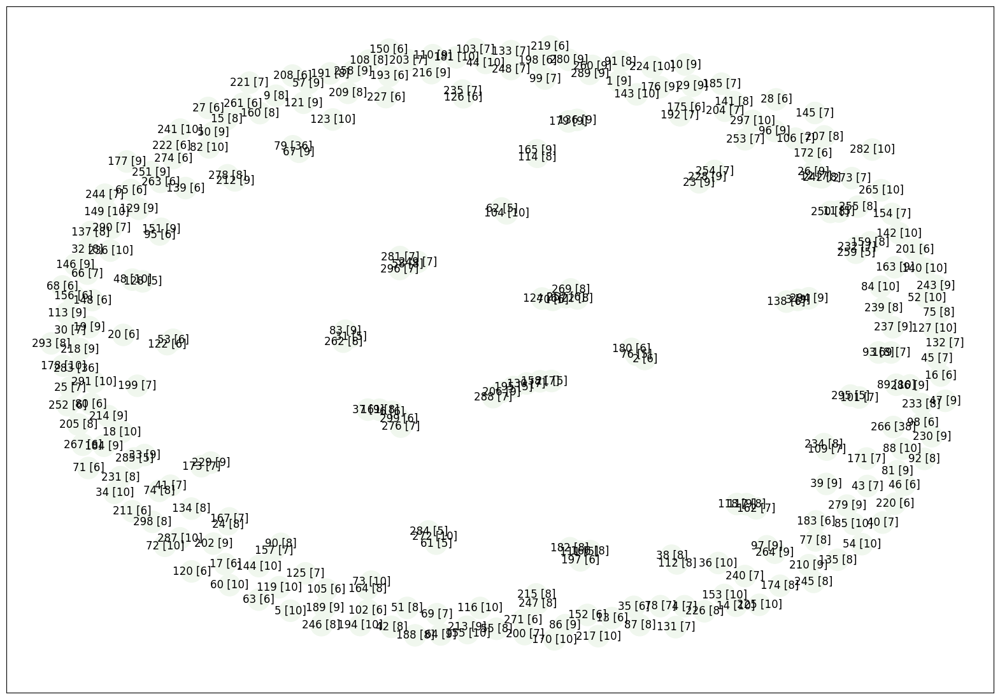


Итерация  8 
**********



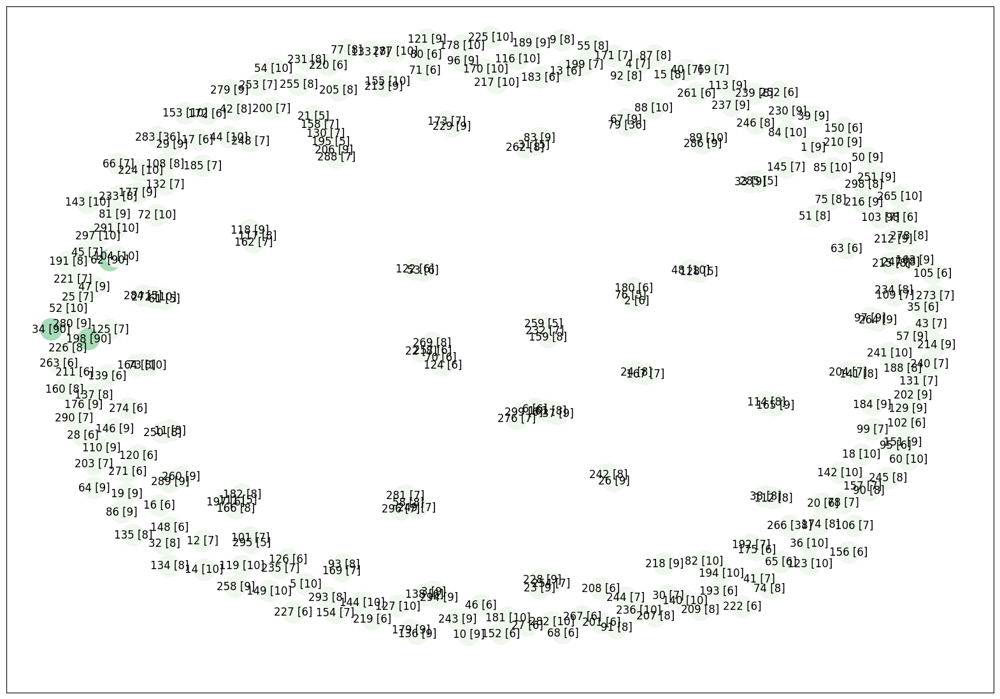


Вершина -> 198
	Степень вершины — 0
	Вершина 198 удалена

Вершина -> 62
	(104) 10 -> 101
	Вершина 62 удалена

Вершина -> 34
	Степень вершины — 0
	Вершина 34 удалена
Работаем с  [104]

Вершина -> 104
	Степень вершины — 0
	Вершина 104 удалена


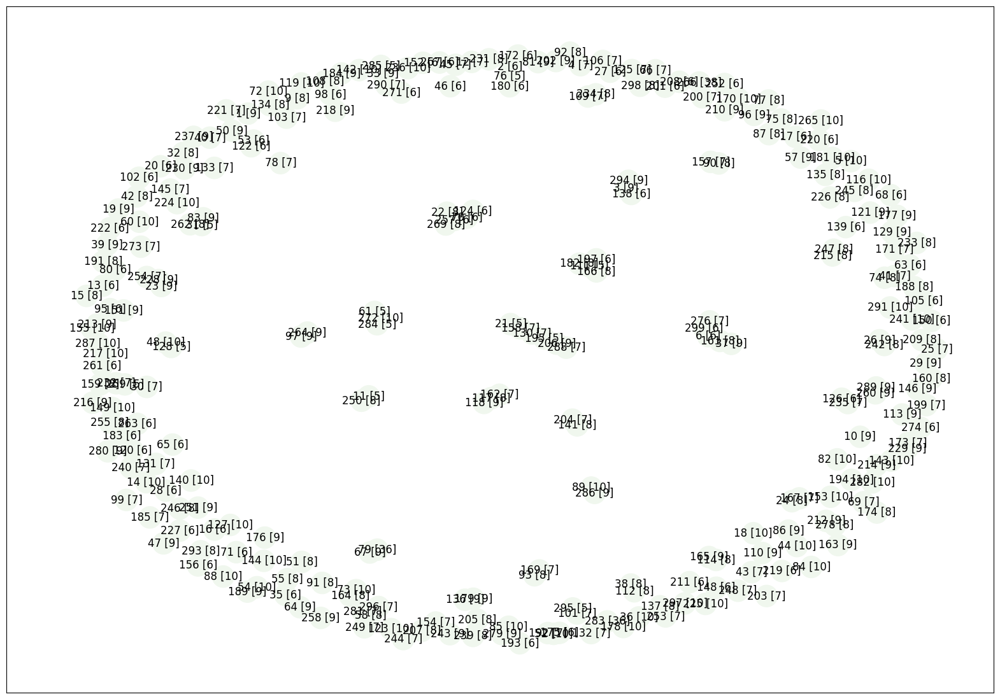


Итерация  9 
**********



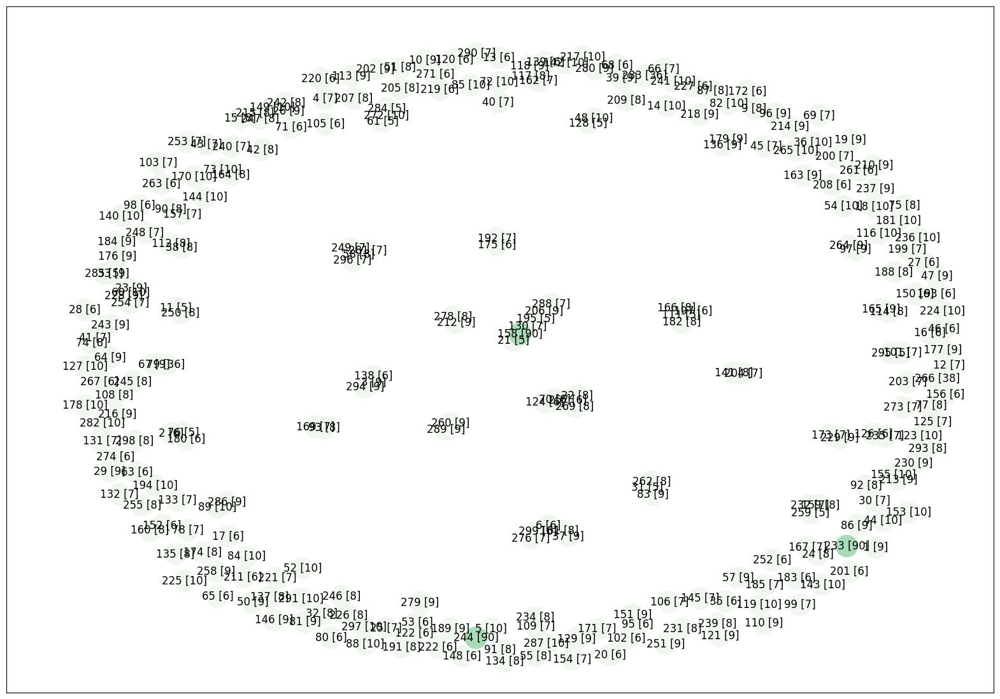


Вершина -> 233
	Степень вершины — 0
	Вершина 233 удалена

Вершина -> 244
	Степень вершины — 0
	Вершина 244 удалена

Вершина -> 158
	(21) 5 -> 50
	(130) 7 -> 52
	Вершина 158 удалена
Работаем с  [21, 130]

Вершина -> 21
Загрузка меньше 90 или вершина не существует

Вершина -> 130
Загрузка меньше 90 или вершина не существует


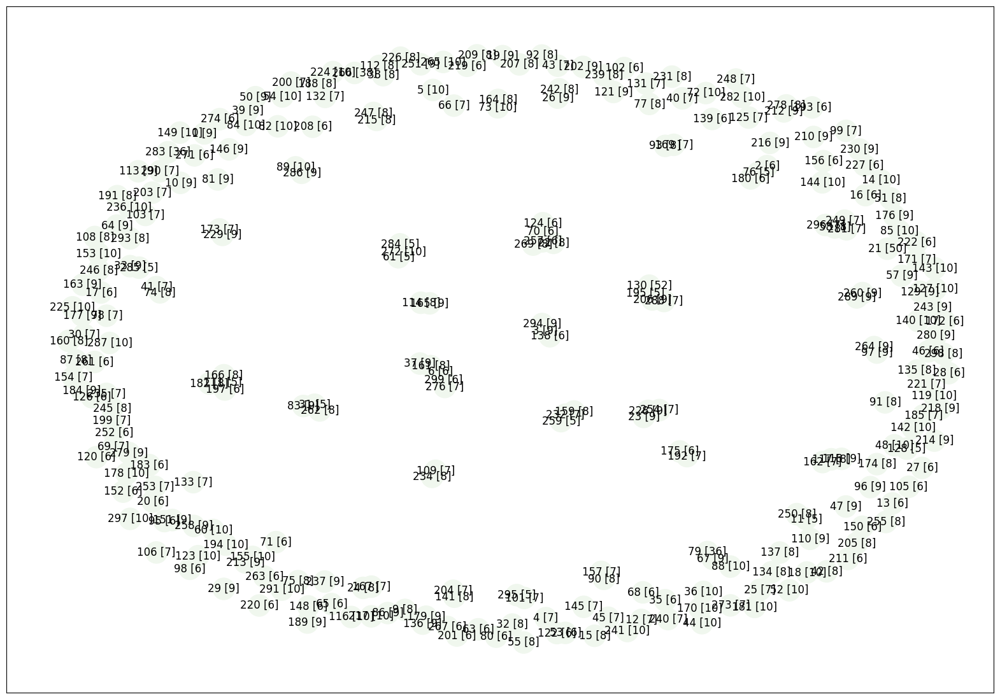

In [19]:
def iterations(G, neighbor_list):
    print('Работаем с ', neighbor_list)
    all_neighbor_list = []
    for node in neighbor_list:
        all_neighbor_list += changing_load(G, [node])
    draw_graph(G, all_neighbor_list)
    return all_neighbor_list


# Копируем граф для работы с ним
G_copy = G.copy()
sigma1, sigma2 = 0, 0

start_time_three_points = time.time()

for iterr in range(1, 10):
    print('Итерация ', iterr, '\n**********\n')
    if not neighbor_list:
        # Выбираем три точки-эпицентра
        start_nodes = rnd.sample(list(G_copy.nodes), 3)
        for node in start_nodes:
            G_copy.nodes[node]['load'] = max_load
        draw_graph(G_copy, start_nodes)
        neighbor_list = changing_load(G_copy, start_nodes)
    if nx.is_empty(G_copy):
        sigma1 = iterr
        break
    if not nx.is_connected(G_copy):
        sigma2 = iterr
    result_neighbor_list = iterations(G_copy, neighbor_list)
    neighbor_list = result_neighbor_list.copy()
    print()

end_time_three_points = time.time()
time_three_points = end_time_three_points - start_time_three_points

4. Сравним результаты пункта 2 и 3:

Сравним время выполнения алгоритмов для 1 и 3 точек:

In [20]:
print(f'Время работы метода с 1 точкой: {time_one_point}')
print(f'Время работы метода с 3 точками: {time_three_points}')

if time_three_points > time_one_point:
    print('Метод с одной начальной точкой быстрее.')
elif time_three_points < time_one_point:
    print('Метод с тремя начальными точками быстрее.')
else:
    print('Методы работают одинаково.')

Время работы метода с 1 точкой: 5.55472993850708
Время работы метода с 3 точками: 6.094541072845459
Метод с одной начальной точкой быстрее.
